csv文件，文件有lottrackid列，一万多条数据。lottrackid有27种。

根据lottrackid，画一个断点柱状图。横轴是时间变化（时间列名：log），竖轴是用了哪台机器（列名hfcno，是int数据，实际数据有2个，5和6）。图中的每小节柱体颜色，要看acnc列的数据，如果是AC，就用绿色，如果是NC，就用红色。

In [2]:
import pandas as pd
data_path = 'data/data.csv'  
df = pd.read_csv(data_path, parse_dates=['log'])

In [3]:
unique_lottrackids = df['lottrackid'].unique()
unique_lottrackids

array([357301, 357310, 357312, 357321, 357330, 357339, 357340, 357351,
       357354, 357387, 357496, 357576, 357580, 357590, 357601, 357876,
       357893, 357914, 357923, 358019, 358029, 358036, 358103, 359469,
       359568, 359753, 359771])

In [7]:
print("\n唯一值统计:")
print(f"机器编号唯一值: {df['hfcno'].unique()}")
print(f"状态唯一值: {df['acnc'].unique()}")
print(f"lottrackid数量: {df['lottrackid'].nunique()}")


唯一值统计:
机器编号唯一值: [5 6]
状态唯一值: ['ac' 'nc']
lottrackid数量: 27


In [9]:
import plotly.graph_objects as go
import pandas as pd

# 确保数据按时间排序
df_sorted = df.sort_values('log')

# 创建图表
fig = go.Figure()

# 分别为AC和NC状态创建柱状图
for status, color in [('ac', 'green'), ('nc', 'red')]:
    mask = df_sorted['acnc'] == status
    status_data = df_sorted[mask]
    
    fig.add_trace(
        go.Bar(
            name=status,
            x=status_data['log'],
            y=status_data['hfcno'],
            marker_color=color,
            opacity=0.7,
            hovertemplate=(
                '<b>LotTrackID</b>: %{customdata}<br>' +
                '<b>Machine</b>: %{y}<br>' +
                '<b>Time</b>: %{x}<br>' +
                '<b>Status</b>: ' + status +
                '<extra></extra>'
            ),
            customdata=status_data['lottrackid'],  # 用于悬停显示lottrackid
        )
    )

# 更新布局
fig.update_layout(
    title='Machine Usage Timeline',
    xaxis_title='Time',
    yaxis_title='Machine Number',
    yaxis=dict(
        tickmode='array',
        ticktext=['Machine 5', 'Machine 6'],
        # tickvals=[5, 6],
        # range=[4.5, 6.5],  # 设置y轴范围，使显示更清晰
    ),
    barmode='overlay',  # 允许柱状图重叠
    hovermode='closest',
    template='plotly_white',
    showlegend=True,
    legend=dict(
        title='Status',
        yanchor="top",
        y=0.99,
        xanchor="right",
        x=0.99
    ),
)

# 更新x轴格式
fig.update_xaxes(tickformat='%Y-%m-%d %H:%M')

# 显示图表
fig.show()

In [ ]:
import plotly.express as px
import plotly.graph_objects as go

# 创建图表
fig = go.Figure()

# 为每个lottrackid创建一个跟踪
colors = px.colors.qualitative.Dark24 + px.colors.qualitative.Light24[:3]  # 27种颜色

# 为每个lottrackid添加数据
for idx, lotid in enumerate(unique_lottrackids):
    # 获取当前lottrackid的数据
    lot_data = df[df['lottrackid'] == lotid].copy()
    
    # 确保数据按时间排序
    lot_data = lot_data.sort_values('log')
    
    # 为AC和NC分别创建跟踪
    for status, color in [('AC', 'green'), ('NC', 'red')]:
        mask = lot_data['acnc'] == status
        status_data = lot_data[mask]
        
        if not status_data.empty:
            fig.add_trace(
                go.Bar(
                    name=f'Lot {lotid} - {status}',
                    x=[status_data['log'], 
                       status_data['log']],  # 开始和结束时间
                    y=[status_data['hfcno'], 
                       status_data['hfcno']],  # 机器编号
                    orientation='h',  # 水平方向的柱状图
                    marker_color=color,
                    opacity=0.7,
                    hovertemplate=(
                        '<b>LotTrackID</b>: %{text}<br>' +
                        '<b>Machine</b>: %{y}<br>' +
                        '<b>Time</b>: %{x}<br>' +
                        '<b>Status</b>: ' + status +
                        '<extra></extra>'
                    ),
                    text=[lotid] * len(status_data),
                    legendgroup=f'lot_{lotid}',
                    showlegend=True
                )
            )

# 创建下拉菜单
updatemenus = [
    {
        'buttons': [
            {
                'method': 'update',
                'label': '显示所有',
                'args': [{'visible': [True] * len(fig.data)}],
            }
        ],
        'direction': 'down',
        'showactive': True,
        'x': 0.1,
        'xanchor': 'left',
        'y': 1.15,
        'yanchor': 'top',
    }
]

# 为每个lottrackid添加一个选项
for lotid in unique_lottrackids:
    visible = [False] * len(fig.data)
    # 找出属于当前lotid的所有trace的索引
    for i, trace in enumerate(fig.data):
        if isinstance(trace.name, str) and str(lotid) in trace.name:
            visible[i] = True
    
    button = {
        'method': 'update',
        'label': f'Lot {lotid}',
        'args': [{'visible': visible}]
    }
    updatemenus[0]['buttons'].append(button)

# 更新布局
fig.update_layout(
    title='Machine Usage Timeline by Lot',
    xaxis_title='Time',
    yaxis_title='Machine Number',
    yaxis=dict(
        tickmode='array',
        ticktext=['Machine 5', 'Machine 6'],
        tickvals=[5, 6],
    ),
    barmode='overlay',  # 允许柱状图重叠
    hovermode='closest',
    updatemenus=updatemenus,
    template='plotly_white',
    margin=dict(t=150),
    showlegend=True,
    legend=dict(
        title='Lot ID - Status',
        groupclick="toggleitem"
    ),
)

# 更新x轴格式
fig.update_xaxes(tickformat='%Y-%m-%d %H:%M')

# 显示图表
fig.show()

In [ ]:
import plotly.graph_objects as go
import pandas as pd

# 确保数据按时间排序
df_sorted = df.sort_values('log')

# 创建图表
fig = go.Figure()

# 分别为ac和nc状态创建水平柱状图
for status, color in [('ac', 'green'), ('nc', 'red')]:
    mask = df_sorted['acnc'] == status
    status_data = df_sorted[mask]
    
    fig.add_trace(
        go.Bar(
            name=status.upper(),  # 显示为大写
            x=status_data['log'],  # 时间作为x轴
            y=status_data['hfcno'],  # 机器编号作为y轴
            marker_color=color,
            opacity=0.7,
            orientation='h',  # 设置为水平方向
            hovertemplate=(
                '<b>LotTrackID</b>: %{customdata}<br>' +
                '<b>Machine</b>: %{y}<br>' +
                '<b>Time</b>: %{x|%Y-%m-%d %H:%M:%S}<br>' +
                '<b>Status</b>: ' + status.upper() +
                '<extra></extra>'
            ),
            customdata=status_data['lottrackid'],
            width=0.8  # 设置柱子的宽度（在y轴方向上的宽度）
        )
    )

# 更新布局
fig.update_layout(
    title={
        'text': 'Machine Usage Timeline',
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'
    },
    xaxis_title='Time',
    yaxis_title='Machine Number',
    yaxis=dict(
        tickmode='array',
        ticktext=['Machine 5', 'Machine 6'],
        tickvals=[5, 6],
        range=[4.5, 6.5],  # 设置y轴范围，使显示更清晰
        side='left'  # 确保y轴标签在左侧
    ),
    barmode='overlay',  # 允许柱状图重叠
    hovermode='closest',
    template='plotly_white',
    showlegend=True,
    legend=dict(
        title='Status',
        yanchor="top",
        y=0.99,
        xanchor="right",
        x=0.99
    ),
    # 设置边距
    margin=dict(l=120, r=50, t=100, b=80)
)

# 更新x轴格式
# fig.update_xaxes(
#     tickformat='%Y-%m-%d %H:%M',
#     rangeslider=dict(visible=True),  # 添加时间范围选择器
#     rangeselector=dict(
#         buttons=list([
#             dict(count=1, label="1小时", step="hour", stepmode="backward"),
#             dict(count=6, label="6小时", step="hour", stepmode="backward"),
#             dict(count=12, label="12小时", step="hour", stepmode="backward"),
#             dict(count=1, label="1天", step="day", stepmode="backward"),
#             dict(count=7, label="1周", step="day", stepmode="backward"),
#             dict(step="all", label="全部")
#         ])
#     )
# )

# 显示图表
fig.show()

In [11]:
import plotly.graph_objects as go
import pandas as pd

# 确保数据按时间排序
df_sorted = df.sort_values('log')

# 创建图表
fig = go.Figure()

# 分别为ac和nc状态创建水平柱状图
for status, color in [('ac', 'green'), ('nc', 'red')]:
    mask = df_sorted['acnc'] == status
    status_data = df_sorted[mask]
    
    fig.add_trace(
        go.Bar(
            name=status.upper(),  # 显示为大写
            x=status_data['log'],  # 时间作为x轴
            y=status_data['hfcno'],  # 机器编号作为y轴
            marker_color=color,
            opacity=0.7,
            orientation='h',  # 设置为水平方向
            hovertemplate=(
                '<b>LotTrackID</b>: %{customdata}<br>' +
                '<b>Machine</b>: %{y}<br>' +
                '<b>Time</b>: %{x|%Y-%m-%d %H:%M:%S}<br>' +
                '<b>Status</b>: ' + status.upper() +
                '<extra></extra>'
            ),
            customdata=status_data['lottrackid'],
            width=0.8  # 设置柱子的宽度（在y轴方向上的宽度）
        )
    )

# 更新布局
fig.update_layout(
    title={
        'text': 'Machine Usage Timeline',
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'
    },
    xaxis_title='Time',
    yaxis_title='Machine Number',
    yaxis=dict(
        tickmode='array',
        ticktext=['Machine 5', 'Machine 6'],
        tickvals=[5, 6],
        range=[4.5, 6.5],  # 设置y轴范围，使显示更清晰
        side='left'  # 确保y轴标签在左侧
    ),
    barmode='group',  # 改为'group'模式，避免重叠
    bargap=0,  # 减小组间距
    bargroupgap=0.1,  # 设置组内间距
    hovermode='closest',
    template='plotly_white',
    showlegend=True,
    legend=dict(
        title='Status',
        yanchor="top",
        y=0.99,
        xanchor="right",
        x=0.99
    ),
    # 设置边距
    margin=dict(l=120, r=50, t=100, b=80)
)

# 更新x轴格式，显示更详细的时间
# fig.update_xaxes(
#     tickformat='%Y-%m-%d %H:%M',  # 显示到分钟
#     dtick=60*1000*15,  # 每15分钟显示一个刻度
#     rangeslider=dict(visible=True),  # 添加时间范围选择器
#     rangeselector=dict(
#         buttons=list([
#             dict(count=30, label="30分钟", step="minute", stepmode="backward"),
#             dict(count=1, label="1小时", step="hour", stepmode="backward"),
#             dict(count=3, label="3小时", step="hour", stepmode="backward"),
#             dict(count=6, label="6小时", step="hour", stepmode="backward"),
#             dict(count=12, label="12小时", step="hour", stepmode="backward"),
#             dict(step="all", label="全部")
#         ])
#     )
# )

# 显示图表
fig.show()

In [12]:
import plotly.graph_objects as go
import pandas as pd
from datetime import datetime

# 创建图表
fig = go.Figure()

# 为每一行数据创建一个横条
for idx, row in df.sort_values(by=['hfcno', 'log'], ascending=[False, True]).iterrows():
    # 获取当前记录的时间
    current_time = row['log']
    
    # 确定颜色
    color = 'green' if row['acnc'] == 'ac' else 'red'
    
    fig.add_trace(
        go.Bar(
            name='',  # 不显示每个trace的名字
            x=[current_time],  # 时间点
            y=[row['hfcno']],  # 机器编号
            marker_color=color,
            orientation='h',
            width=0.8,  # 柱子的宽度
            showlegend=False,  # 不显示图例
            hovertemplate=(
                '<b>LotTrackID</b>: %{customdata}<br>' +
                '<b>Machine</b>: %{y}<br>' +
                '<b>Time</b>: %{x|%Y-%m-%d %H:%M:%S}<br>' +
                '<b>Status</b>: ' + row['acnc'].upper() +
                '<extra></extra>'
            ),
            customdata=[row['lottrackid']]
        )
    )

# 创建图例
fig.add_trace(
    go.Bar(
        name='AC',
        x=[None],
        y=[None],
        marker_color='green',
        showlegend=True
    )
)

fig.add_trace(
    go.Bar(
        name='NC',
        x=[None],
        y=[None],
        marker_color='red',
        showlegend=True
    )
)

# 更新布局
fig.update_layout(
    title={
        'text': 'Machine Usage Timeline',
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'
    },
    xaxis_title='Time',
    yaxis_title='Machine Number',
    yaxis=dict(
        tickmode='array',
        ticktext=['Machine 5', 'Machine 6'],
        tickvals=[5, 6],
        range=[4.5, 6.5],
        side='left'
    ),
    barmode='overlay',  # 允许重叠
    hovermode='closest',
    template='plotly_white',
    legend=dict(
        title='Status',
        yanchor="top",
        y=0.99,
        xanchor="right",
        x=0.99,
        orientation="h"  # 水平放置图例
    ),
    margin=dict(l=120, r=50, t=100, b=80)
)

# 更新x轴格式
fig.update_xaxes(
    tickformat='%m-%d %H:%M',  # 显示月-日 时:分
    dtick='H1',  # 每小时一个刻度
    rangeslider=dict(visible=True),
    rangeselector=dict(
        buttons=list([
            dict(count=1, label="1小时", step="hour", stepmode="backward"),
            dict(count=6, label="6小时", step="hour", stepmode="backward"),
            dict(count=12, label="12小时", step="hour", stepmode="backward"),
            dict(count=1, label="1天", step="day", stepmode="backward"),
            dict(count=7, label="1周", step="day", stepmode="backward"),
            dict(step="all", label="全部")
        ])
    )
)

# 显示图表
fig.show()

In [14]:
# 定义颜色映射
color_map = {"ac": "green", "nc": "red"}

# 遍历每个 lottrackid，分别绘图
for lot_id in df["lottrackid"].unique():
    df_lot = df[df["lottrackid"] == lot_id]  # 筛选当前 lottrackid 数据
    
    fig = px.bar(
        df_lot, 
        x="log", 
        y="hfcno", 
        color="acnc",
        color_discrete_map=color_map,  # 根据 AC/NC 设置颜色
        title=f"LotTrackID: {lot_id}",
        labels={"log": "时间", "hfcno": "机器编号"},
        orientation="h",
        hover_data={"lottrackid": True}  # 悬浮显示 lottrackid
    )

    fig.show()  # 显示图表

In [18]:
import plotly.graph_objects as go
import pandas as pd
# 过滤掉没有使用机器的数据
df_sorted = df.sort_values("log")
# df_sorted = df_sorted[df_sorted["hfcno"].notna()]  # 只保留有机器编号的数据
# df_sorted = df_sorted[df_sorted["hfcno"] > 0]  # 过滤掉 hfcno=0 或无效值

# 定义颜色映射
color_map = {"ac": "green", "nc": "red"}

# 创建图表
fig = go.Figure()

# 分别为 AC 和 NC 状态创建水平柱状图
for status, color in color_map.items():
    mask = df_sorted["acnc"] == status
    status_data = df_sorted[mask]

    fig.add_trace(
        go.Bar(
            name=status,  # 显示为 AC/NC
            x=status_data["log"],  # 时间作为 x 轴
            y=status_data["hfcno"],  # 机器编号作为 y 轴
            marker_color=color,
            opacity=0.7,
            orientation="h",  # 设置为水平方向
            hovertemplate=(
                "<b>LotTrackID</b>: %{customdata}<br>"
                "<b>Machine</b>: %{y}<br>"
                "<b>Time</b>: %{x|%Y-%m-%d %H:%M:%S}<br>"
                "<b>Status</b>: " + status +
                "<extra></extra>"
            ),
            customdata=status_data["lottrackid"],  # 悬停显示 LotTrackID
            width=0.8  # 柱子的宽度
        )
    )

# 更新布局
fig.update_layout(
    title={
        "text": "Machine Usage Timeline",
        "y": 0.95,
        "x": 0.5,
        "xanchor": "center",
        "yanchor": "top"
    },
    xaxis_title="Time",
    yaxis_title="Machine Number",
    yaxis=dict(
        tickmode="array",
        ticktext=["Machine 5", "Machine 6"],
        tickvals=[5, 6],
        range=[4.5, 6.5],  # 确保显示完整
        side="left"
    ),
    barmode="relative",  # 避免完全重叠导致柱子不可见
    hovermode="closest",
    template="plotly_white",
    showlegend=True,
    legend=dict(
        title="Status",
        yanchor="top",
        y=0.99,
        xanchor="right",
        x=0.99
    ),
    margin=dict(l=120, r=50, t=100, b=80)  # 设置边距
)

# 显示图表
fig.show()

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# 假设你的数据存储在DataFrame df中
# df包含列：lottrackid, log, hfcno, acnc

# 创建一个图表
fig, ax = plt.subplots(figsize=(20, 8))

# 按lottrackid分组
grouped = df.groupby('lottrackid')

# 为每个lottrackid绘制柱状图
for lottrackid, group in grouped:
    # 按时间排序
    group = group.sort_values('log')
    
    # 遍历每个时间段
    for i in range(len(group) - 1):
        start_time = group.iloc[i]['log']
        end_time = group.iloc[i + 1]['log']
        hfcno = group.iloc[i]['hfcno']
        acnc = group.iloc[i]['acnc']
        
        # 设置颜色
        color = 'green' if acnc == 'ac' else 'red'
        
        # 绘制柱状图
        bar = ax.barh(hfcno, end_time - start_time, left=start_time, color=color, alpha=0.6, label=f'LottrackID: {lottrackid}')
        
        # 添加鼠标悬停提示
        def on_hover(event):
            if event.inaxes == ax:
                for b in bar:
                    if b.contains(event)[0]:
                        plt.gca().set_title(f'LottrackID: {lottrackid}')
                        fig.canvas.draw_idle()
        
        fig.canvas.mpl_connect('motion_notify_event', on_hover)

# 设置图表属性
ax.set_xlabel('Time')
ax.set_ylabel('Machine Number')
ax.set_title('Machine Usage Timeline')
ax.set_yticks([5, 6])  # 设置机器编号的刻度
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')  # 添加图例

plt.tight_layout()
plt.show()

C:\Users\splsip258\AppData\Local\Temp\ipykernel_1960\2324269396.py:49: UserWarning:

Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.



In [4]:
# 按lottrackid分组，并获取每个lottrackid的起始和终止时间
time_ranges = df.groupby('lottrackid')['log'].agg(['min', 'max']).reset_index()
time_ranges.columns = ['lottrackid', 'start_time', 'end_time']

# 将起始和终止时间合并到原始数据中
df1 = df.merge(time_ranges, on='lottrackid', how='left')

# 查看更新后的数据
print(df1.head())

   lotlogid  lottrackid  type                 log  status1  status2  trayno  \
0  31519041      357301    10 2023-02-02 09:25:00        1        1     557   
1  31519042      357301    10 2023-02-02 09:25:00      115        1     557   
2  31519050      357301    10 2023-02-02 09:26:00       -1        1     557   
3  31519058      357301    10 2023-02-02 09:27:00       -1        1     557   
4  31519059      357301    10 2023-02-02 09:27:00      115        2     557   

   maept  hfcno  hfchp  ...  pv2  sp2  sts2  seg2  pg2  mcno  acnc  \
0      2      5      2  ...  NaN  NaN   NaN   NaN  NaN     3    ac   
1      2      5      2  ...  NaN  NaN   NaN   NaN  NaN     3    ac   
2      2      5      2  ...  NaN  NaN   NaN   NaN  NaN     3    ac   
3      2      5      2  ...  NaN  NaN   NaN   NaN  NaN     3    ac   
4      2      5      2  ...  NaN  NaN   NaN   NaN  NaN     3    ac   

     source_file          start_time            end_time  
0  357301_ac.csv 2023-02-02 09:25:00 2023-02-

In [ ]:
# 按lottrackid分组，并获取每个lottrackid的起始和终止时间
time_ranges = df.groupby('lottrackid')['log'].agg(['min', 'max']).reset_index()
time_ranges.columns = ['lottrackid', 'start_time', 'end_time']

# 遍历每个lottrackid的时间范围
for idx, row in time_ranges.iterrows():
    lottrackid = row['lottrackid']
    start_time = row['start_time']
    end_time = row['end_time']
    print(f"LottrackID: {lottrackid}, 起始时间: {start_time}, 终止时间: {end_time}")

Text(0.5, 1.0, 'Machine Job Timeline with Visual Inspection (AC/NC)')

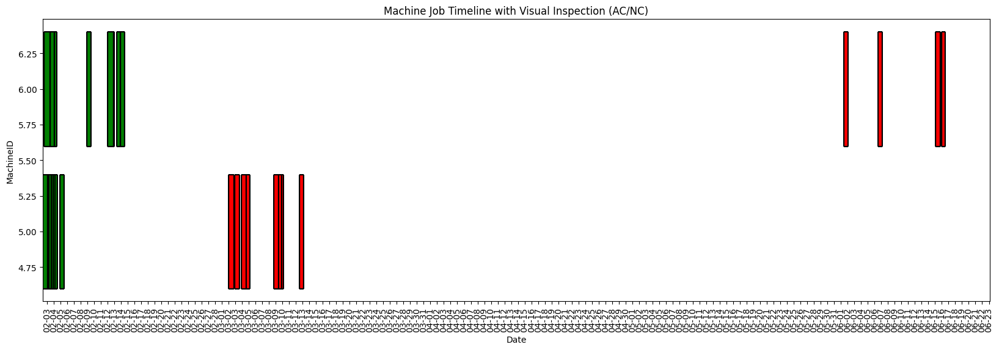

In [9]:
import matplotlib.dates as mdates
import matplotlib.pyplot as plt

color_map = {'ac': 'green', 'nc': 'red'}
# Create the figure and axis for the plot
fig, ax = plt.subplots(figsize=(20, 6))

# Iterate over the rows of the DataFrame to plot each MachineID's job as a rectangle
for idx, row in df1.sort_values(by=['hfcno', 'log'], ascending=False).iterrows():
    # Create a rectangle for each job
    start_time = row['start_time']
    end_time = row['end_time']
    machine_id = row['hfcno']
    
    # Determine the color based on the 'Visual Inspection' column
    color = color_map.get(row['acnc'], 'blue')  # Default to 'blue' if no match
    
    # 确保start_time和end_time是datetime类型
    # if not isinstance(start_time, datetime):
    #     start_time = pd.to_datetime(start_time)
    # if not isinstance(end_time, datetime):
    #     end_time = pd.to_datetime(end_time)

    # # 计算时间差（以天为单位）
    # time_diff = (end_time - start_time).total_seconds() / (60 * 60 * 24)

    # Add a rectangle for the job
    ax.barh(machine_id, (end_time - start_time).total_seconds() / (60 * 60 * 24), 
            left=start_time, height=0.8, color=color, edgecolor='black')

# Set the x-axis format for dates
ax.xaxis.set_major_locator(mdates.DayLocator(interval=1))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d'))
# rotate the x-axis labels
plt.xticks(rotation=90)

# Set labels and title
ax.set_xlabel('Date')
ax.set_ylabel('MachineID')
ax.set_title('Machine Job Timeline with Visual Inspection (AC/NC)')

In [17]:
pd.set_option('display.max_columns', None)
unique_a_values = df1.drop_duplicates(subset=['lottrackid'])
sorted_unique_lottrackids = unique_a_values.sort_values(by='log')
sorted_unique_lottrackids

,lotlogid,lottrackid,type,log,status1,status2,trayno,maept,hfcno,hfchp,yakitemp,ajihz,atopt,tfhp,keiro,tuuka,plc0,plc1,plc2,plc3,plc4,plc5,plc6,plc7,plc8,plc9,plc10,pv1,sp1,sts1,seg1,pg1,pv2,sp2,sts2,seg2,pg2,mcno,acnc,source_file,start_time,end_time
0,31519041,357301,10,2023-02-02 09:25:00,1,1,557,2,5,2,60,40,4,7,8,0,116,133,157,158,120,4,114,110,10540,101,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3,ac,357301_ac.csv,2023-02-02 09:25:00,2023-02-03 00:43:00
675,31521370,357310,10,2023-02-02 14:09:00,-1,0,566,2,6,2,60,40,4,7,8,0,118,143,160,160,89,4,114,110,12525,103,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,ac,357310_ac.csv,2023-02-02 14:09:00,2023-02-03 08:17:00
1338,31521677,357312,10,2023-02-02 14:46:00,-1,0,568,2,5,2,60,40,4,7,8,0,118,117,160,158,84,4,114,110,12429,103,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,ac,357312_ac.csv,2023-02-02 14:46:00,2023-02-03 05:45:00
2003,31525648,357321,10,2023-02-02 23:38:00,1,1,577,2,5,2,60,40,4,7,8,0,118,143,160,160,105,4,114,110,14214,103,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,ac,357321_ac.csv,2023-02-02 23:38:00,2023-02-03 13:51:00
2663,31529465,357330,10,2023-02-03 06:45:00,1,1,586,2,5,2,60,40,4,7,8,0,119,157,158,159,115,4,114,110,11518,103,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,ac,357330_ac.csv,2023-02-03 06:45:00,2023-02-03 20:37:00
3342,31532029,357339,10,2023-02-03 11:57:00,1,1,596,2,5,2,60,40,4,7,8,0,119,140,160,160,95,4,114,110,12821,103,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,ac,357339_ac.csv,2023-02-03 11:57:00,2023-02-04 02:39:00
4007,31532323,357340,10,2023-02-03 12:31:00,-1,0,597,2,6,2,60,40,4,7,8,0,117,127,163,160,69,4,114,110,24297,100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3,ac,357340_ac.csv,2023-02-03 12:31:00,2023-02-04 00:12:00
4669,31536522,357351,10,2023-02-03 22:04:00,-1,1,608,2,6,2,60,40,4,7,8,0,117,130,162,162,93,4,114,110,10464,103,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,ac,357351_ac.csv,2023-02-03 22:04:00,2023-02-04 09:06:00
5338,31537449,357354,10,2023-02-03 23:39:00,-1,0,611,2,5,2,60,40,4,7,8,0,118,125,162,162,72,4,114,110,10933,100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3,ac,357354_ac.csv,2023-02-03 23:39:00,2023-02-04 11:11:00
6035,31548838,357387,21,2023-02-04 22:09:00,0,0,644,2,5,2,60,40,4,7,8,0,8991,844,0,4000,10223,0,0,88,437,0,0.0,900.2,900.0,18.0,10.0,37.0,0.993,1.0,17.0,1.0,37.0,5,ac,357387_ac.csv,2023-02-04 22:09:00,2023-02-05 10:39:00


Text(0.5, 1.0, 'Machine Job Timeline with Visual Inspection (AC/NC)')

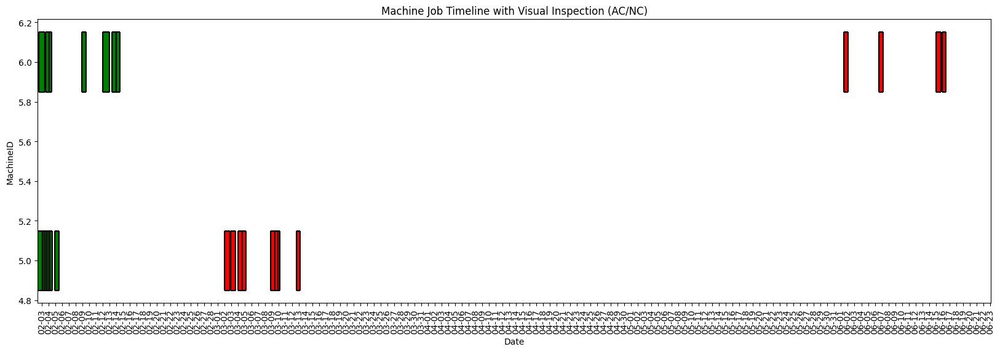

In [19]:
import matplotlib.dates as mdates
import matplotlib.pyplot as plt

color_map = {'ac': 'green', 'nc': 'red'}
# Create the figure and axis for the plot
fig, ax = plt.subplots(figsize=(20, 6))

# Iterate over the rows of the DataFrame to plot each MachineID's job as a rectangle
for idx, row in df1.sort_values(by=['hfcno', 'log'], ascending=False).iterrows():
    # Create a rectangle for each job
    start_time = row['start_time']
    end_time = row['end_time']
    machine_id = row['hfcno']
    
    # Determine the color based on the 'Visual Inspection' column
    color = color_map.get(row['acnc'], 'blue')  # Default to 'blue' if no match
    
    # 确保start_time和end_time是datetime类型
    # if not isinstance(start_time, datetime):
    #     start_time = pd.to_datetime(start_time)
    # if not isinstance(end_time, datetime):
    #     end_time = pd.to_datetime(end_time)

    # # 计算时间差（以天为单位）
    # time_diff = (end_time - start_time).total_seconds() / (60 * 60 * 24)

    # Add a rectangle for the job
    ax.barh(machine_id, (end_time - start_time).total_seconds() / (60 * 60 * 24), 
            left=start_time, height=0.3, color=color, edgecolor='black')

# Set the x-axis format for dates
ax.xaxis.set_major_locator(mdates.DayLocator(interval=1))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d'))
# rotate the x-axis labels
plt.xticks(rotation=90)

# Set labels and title
ax.set_xlabel('Date')
ax.set_ylabel('MachineID')
ax.set_title('Machine Job Timeline with Visual Inspection (AC/NC)')